In [1]:
import numpy as np
import pandas as pd
import nltk

import wordcloud
  
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates
plt.style.use('dark_background')

# Loading word embedding computed a pre-trained model and stop words for English

In [2]:
data = np.load('sentences_embedding/word_embedding.npy')
print(type(data))
print(data.shape)

<class 'numpy.ndarray'>
(44996, 200)


In [3]:
pca = PCA(n_components=10)
data_pca = pca.fit_transform(data)

In [4]:
print(type(data_pca))
print(data_pca.shape)
print(len(data_pca[0]))

<class 'numpy.ndarray'>
(44996, 10)
10


Weird index: 
20193
Weird index: 
28715
48661445


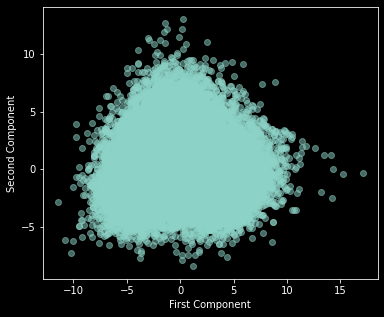

In [5]:
columns = [str(i+1) for i in range(len(data_pca[0]))] #Name of columns: '1', '2', '3', etc
data_frame = pd.DataFrame(data_pca)
data_frame.columns = columns
weird_point = data_frame[data_frame['1']>15.]

for i in range(len(data_pca)):
    if(data_frame['1'][i] == weird_point['1'].values[0]):
        print('Weird index: ')
        print(i)
    if(data_frame['1'][i] == weird_point['1'].values[1]):
        print('Weird index: ')
        print(i)

clean_datatext = pd.read_csv('data/clean_train_data.csv')
        
#28715, 20193 
print(clean_datatext['Id'][28715])

plt.figure(figsize=(6,5))
plt.scatter(data_pca[:,0], data_pca[:,1], alpha=0.5)
plt.xlabel('First Component')
plt.ylabel('Second Component')
plt.show()


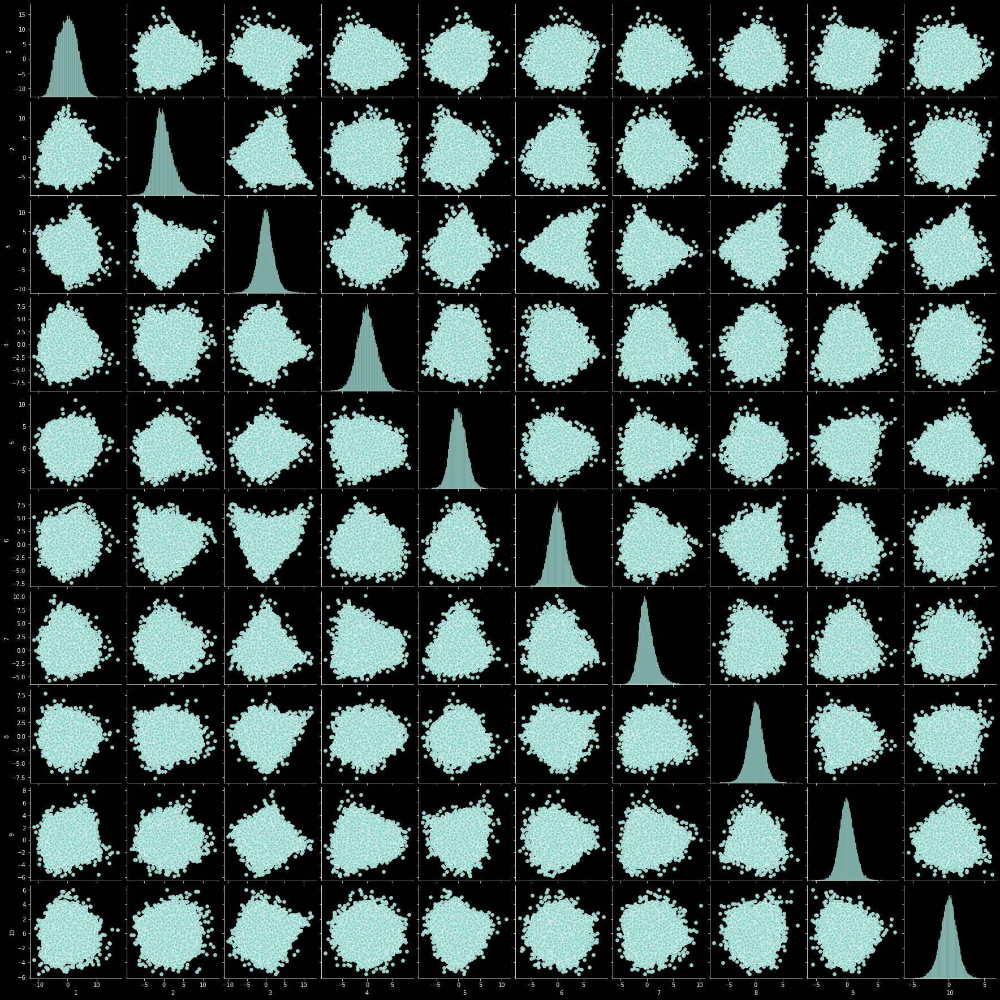

In [6]:
columns = [str(i+1) for i in range(len(data_pca[0]))] #Name of columns: '1', '2', '3', etc
data_frame = pd.DataFrame(data_pca)
data_frame.columns = columns
sns.pairplot(data_frame)

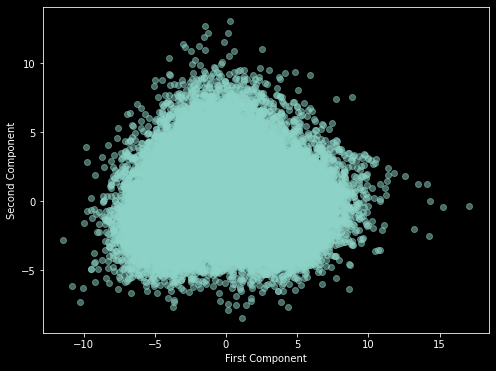

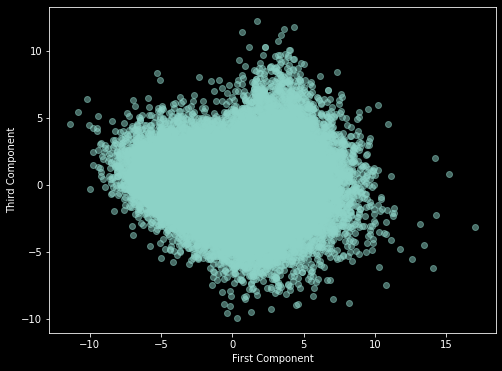

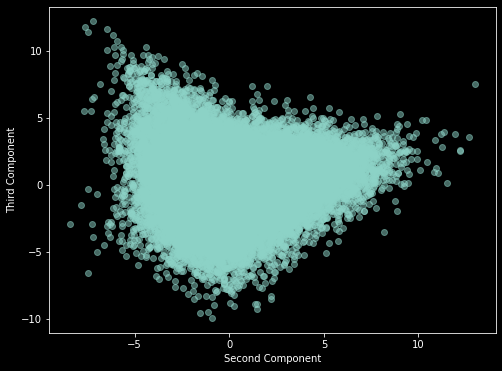

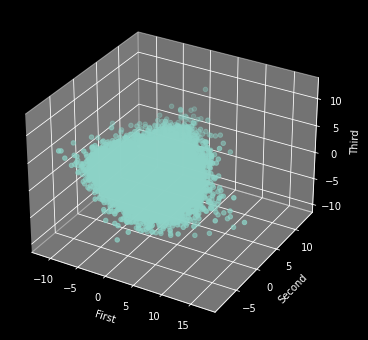

In [7]:
plt.figure(figsize=(8,6))
plt.scatter(data_pca[:,0], data_pca[:,1], alpha=0.5)
plt.xlabel('First Component')
plt.ylabel('Second Component')
plt.show()

plt.figure(figsize=(8,6))
plt.scatter(data_pca[:,0], data_pca[:,2], alpha=0.5)
plt.xlabel('First Component')
plt.ylabel('Third Component')
plt.show()

plt.figure(figsize=(8,6))
plt.scatter(data_pca[:,1], data_pca[:,2], alpha=0.5)
plt.xlabel('Second Component')
plt.ylabel('Third Component')
plt.show()


fig = plt.figure(figsize=(6,6))

ax = fig.add_subplot(projection='3d')
ax.scatter(data_pca[:,0], data_pca[:,1], data_pca[:,2])

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')

plt.show()

## The Elbow method to determine the optimal number of clusters

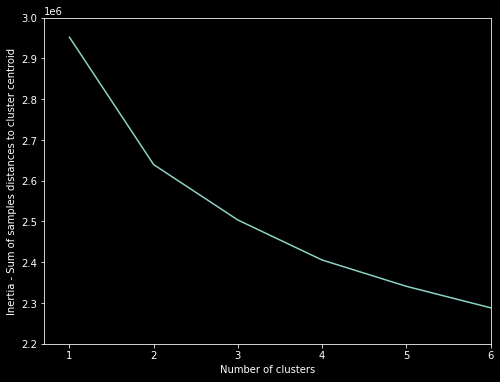

In [8]:
sse = {}
for k in range(1, 9):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(data)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    
plt.figure(figsize=(8,6))
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlim(0.7,6)
plt.ylim(2.2e6,3e6)
plt.xlabel("Number of clusters")
plt.ylabel("Inertia - Sum of samples distances to cluster centroid") #Inertia: Sum of distances of samples to their closest cluster center
plt.show()

In [9]:
kmeans5 = KMeans(n_clusters = 2, random_state =0).fit(data)
clusters5 = kmeans5.labels_ # list with one value per text corresponding to the cluster label

kmeans10 = KMeans(n_clusters = 3, random_state =0).fit(data)
clusters10 = kmeans10.labels_

kmeans15 = KMeans(n_clusters = 4, random_state =0).fit(data)
clusters15 = kmeans15.labels_

kmeans20 = KMeans(n_clusters = 5, random_state =0).fit(data)
clusters20 = kmeans20.labels_

In [10]:
## PCA EXPLANATION VARIANCE

In [11]:
x = pca.inverse_transform(data_pca)
print(x.shape)

(44996, 200)


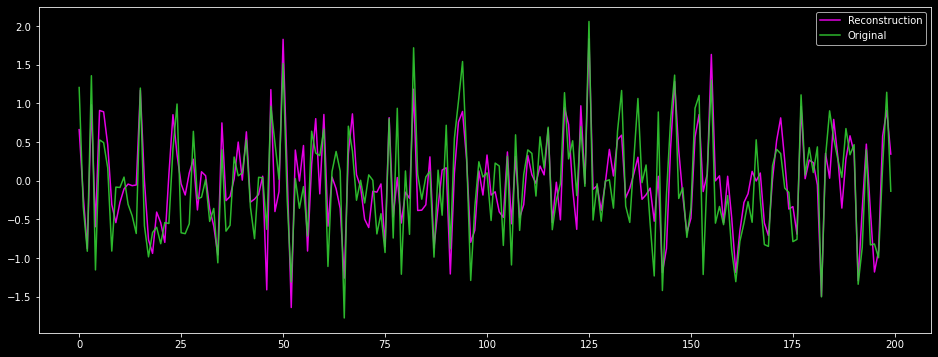

In [12]:
plt.figure(figsize=(16,6))
plt.plot(x[0],'-', alpha = 0.9, c = 'magenta', label='Reconstruction')
plt.plot(data[0],alpha = 0.9 , c = 'limegreen', label='Original')
plt.legend()
plt.show()

In [13]:
xpl = pca.explained_variance_ratio_  #Porcentage of the data described by the corresponding vector
print(xpl[:10]) #Porcentage of data described by each of the first 5 vectors
print(np.sum(xpl)) #Total porcentage of data describe by all the vector components

[0.15668368 0.0847692  0.06869244 0.05748028 0.04954416 0.03959493
 0.03688826 0.02941465 0.0233448  0.02156472]
0.56797713


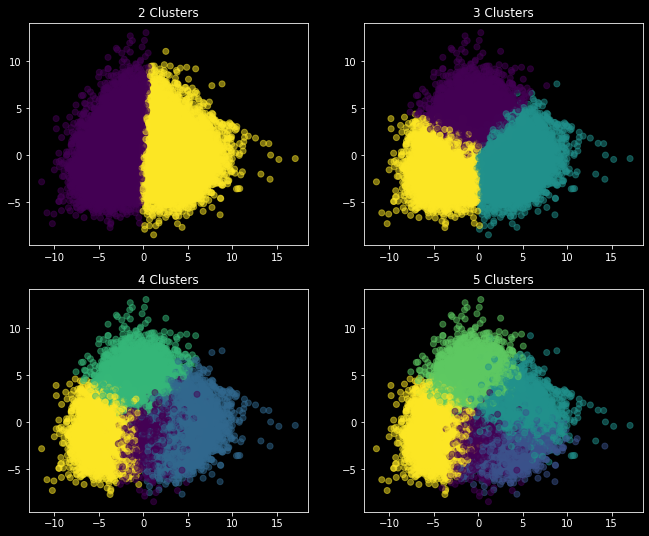

In [14]:
# Exploring with different numbers of clusters
plt.figure(figsize=(11,9))

plt.subplot(2,2,1)
plt.title('2 Clusters')
plt.scatter(data_pca[:,0], data_pca[:,1], c=clusters5, alpha=0.5)

plt.subplot(2,2,2)
plt.title('3 Clusters')
plt.scatter(data_pca[:,0], data_pca[:,1], c=clusters10, alpha=0.5)

plt.subplot(2,2,3)
plt.title('4 Clusters')
plt.scatter(data_pca[:,0], data_pca[:,1], c=clusters15, alpha=0.5)

plt.subplot(2,2,4)
plt.title('5 Clusters')
plt.scatter(data_pca[:,0], data_pca[:,1], c=clusters20, alpha=0.5)

plt.show()

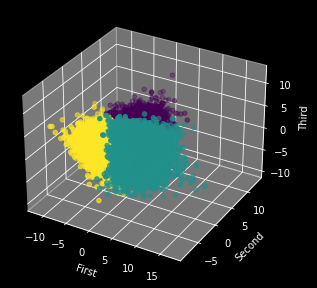

In [15]:
#3d plot of the 3 main components
#%matplotlib notebook
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(projection='3d')
ax.scatter(data_pca[:,0], data_pca[:,1], data_pca[:,2], c=clusters10)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')

plt.show()

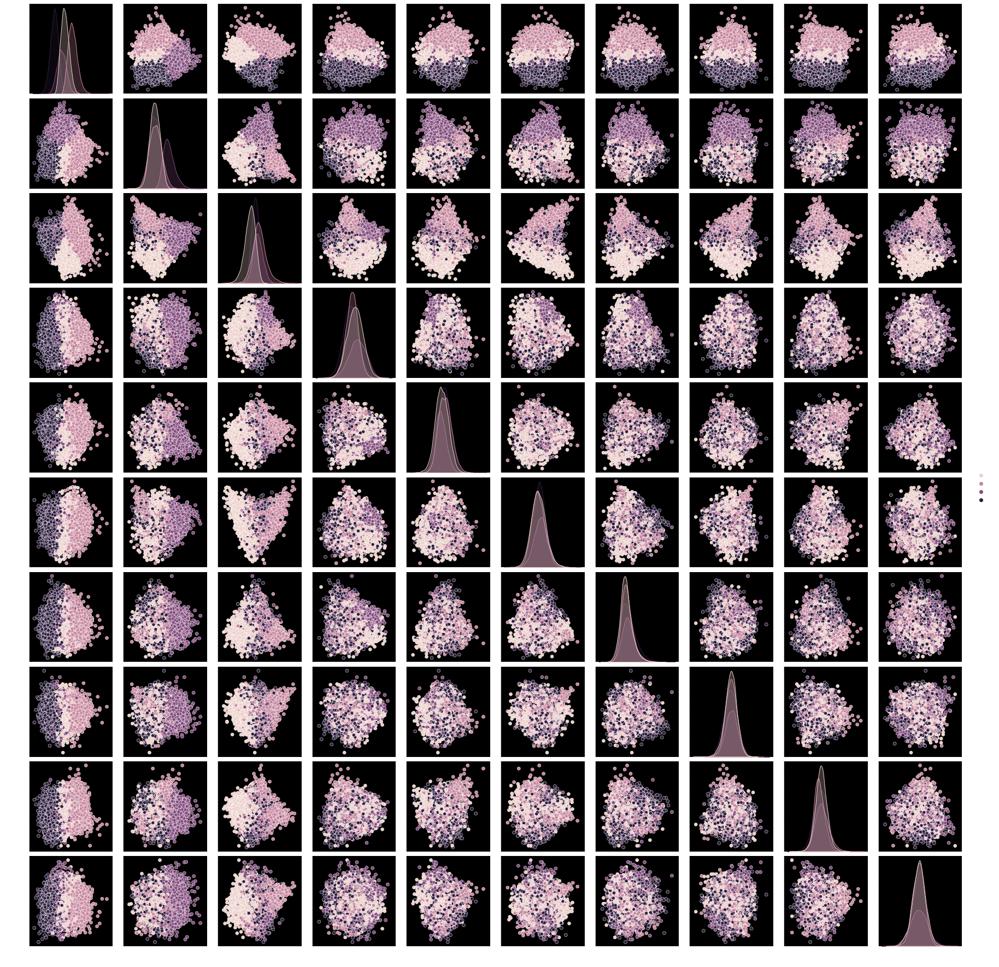

In [16]:
data_frame['c'] = clusters15
%matplotlib inline
sns.pairplot(data_frame, hue = 'c')

In [17]:
#Getting the text indices for each cluster:
k = 4 # Number clusters
indices = []*k
for i in range(k): indices.append([])
    
for j in range(len(clusters15)):
    indices[clusters15[j]].append(j)

In [18]:
np.save('data/indices0_english.npy', indices[0])
np.save('data/indices1_english.npy', indices[1])
np.save('data/indices2_english.npy', indices[2])
np.save('data/indices3_english.npy', indices[3])

In [19]:
## Do the same for stop word with programming words: first with 50 words and later with 100

# Second embedding removing 50 most frequent programming words!

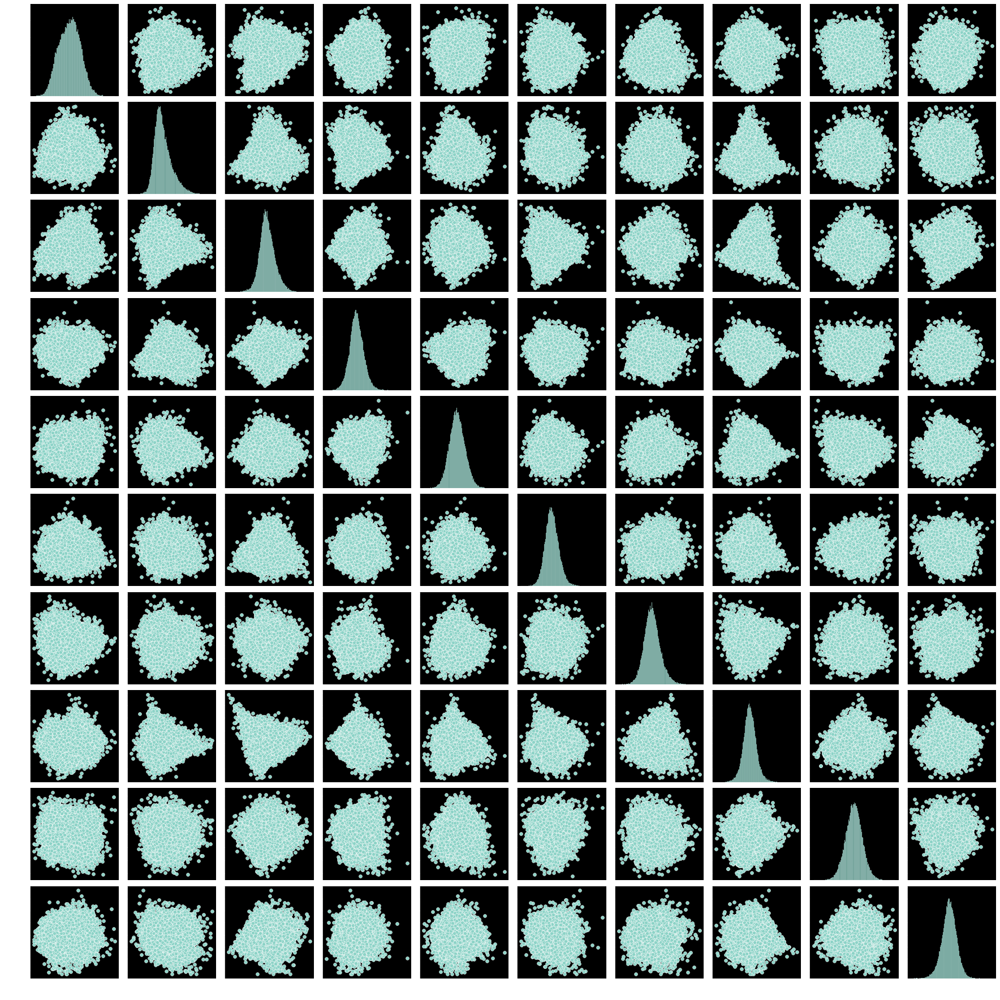

In [20]:
data = np.load('sentences_embedding/word_embedding50stopwords.npy')
pca = PCA(n_components=10)
data_pca = pca.fit_transform(data)

columns = [str(i+1) for i in range(len(data_pca[0]))] #Name of columns: '1', '2', '3', etc
data_frame = pd.DataFrame(data_pca)
data_frame.columns = columns
%matplotlib inline
sns.pairplot(data_frame)

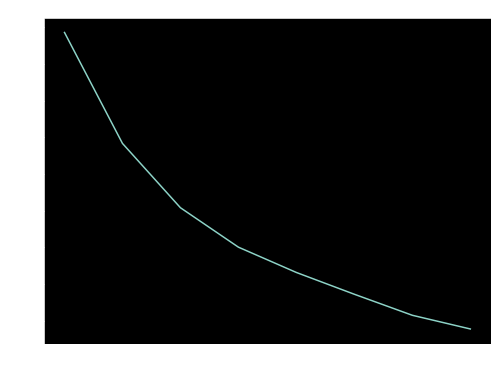

In [21]:
#Elbow method
sse = {}
for k in range(1, 9):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(data)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    
plt.figure(figsize=(8,6))
plt.plot(list(sse.keys()), list(sse.values()))
#plt.xlim(1.5,6)
#plt.ylim(2.6e6,3.1e6)
plt.xlabel("Number of clusters")
plt.ylabel("Inertia - Sum of samples distances to cluster centroid") #Inertia: Sum of distances of samples to their closest cluster center
plt.show()

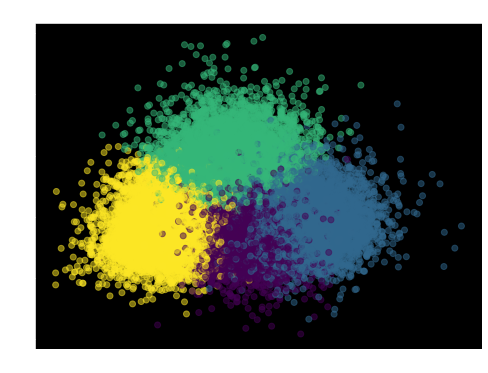

In [22]:
kmeans = KMeans(n_clusters = 4, random_state =0).fit(data)
clusters = kmeans.labels_

plt.figure(figsize=(8,6))
plt.title('4 Clusters')
plt.scatter(data_pca[:,0], data_pca[:,1], c=clusters15, alpha=0.5)
plt.show()

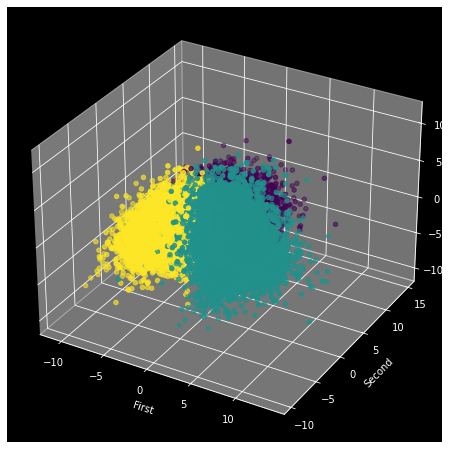

In [23]:
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(projection='3d')
ax.scatter(data_pca[:,0], data_pca[:,1], data_pca[:,2], c=clusters10)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')

plt.show()

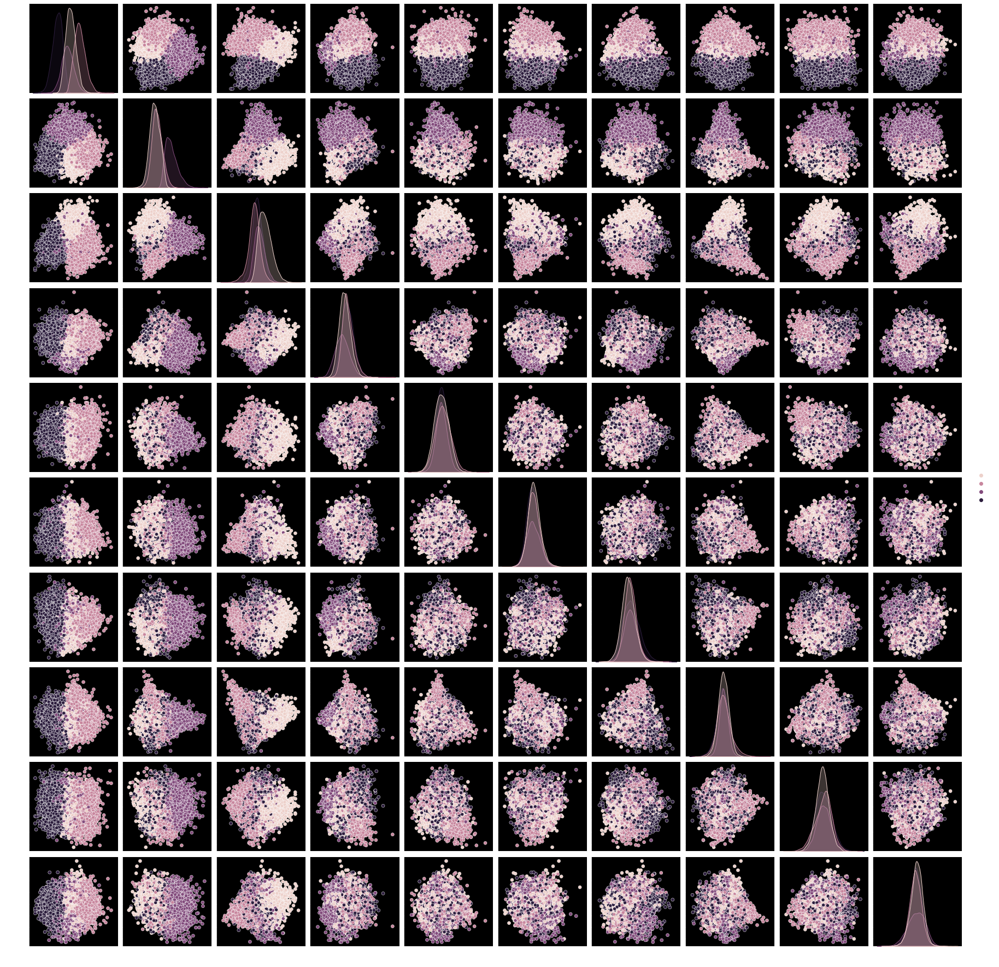

In [24]:
data_frame['c'] = clusters
sns.pairplot(data_frame, hue = 'c')

In [25]:
#Getting the text indices for each cluster:
k = 4 # Number clusters
indices = []*k
for i in range(k): indices.append([])
    
for j in range(len(clusters)):
    indices[clusters[j]].append(j)

In [26]:
np.save('data/indices0_english_50stopwords.npy', indices[0])
np.save('data/indices1_english_50stopwords.npy', indices[1])
np.save('data/indices2_english_50stopwords.npy', indices[2])
np.save('data/indices3_english_50stopwords.npy', indices[3])

# Third embedding removing 50 most frequent programming words!

In [27]:
data = np.load('sentences_embedding/word_embedding100stopwords.npy')
pca = PCA(n_components=10)
data_pca = pca.fit_transform(data)

columns = [str(i+1) for i in range(len(data_pca[0]))] #Name of columns: '1', '2', '3', etc
data_frame = pd.DataFrame(data_pca)
data_frame.columns = columns
%matplotlib inline
#sns.pairplot(data_frame)

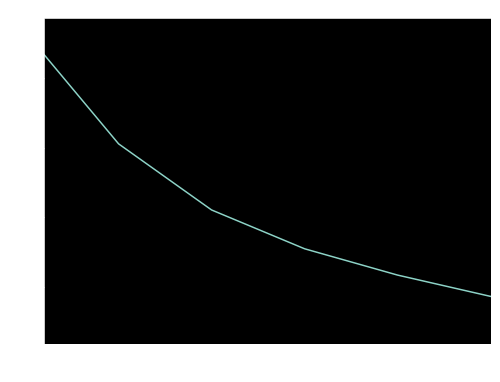

In [28]:

#Elbow method
sse = {}
for k in range(1, 9):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(data)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    
plt.figure(figsize=(8,6))
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlim(1.2,6)
#plt.ylim(2.6e6,3.1e6)
plt.xlabel("Number of clusters")
plt.ylabel("Inertia - Sum of samples distances to cluster centroid") #Inertia: Sum of distances of samples to their closest cluster center
plt.show()


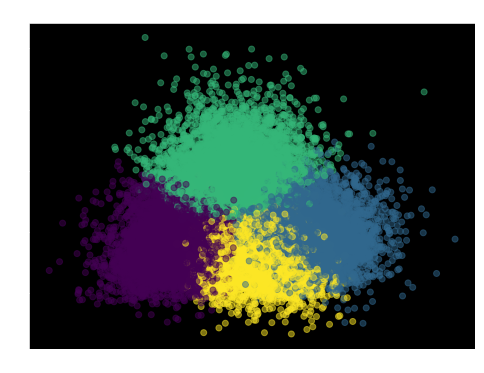

In [29]:
kmeans = KMeans(n_clusters = 4, random_state =0).fit(data)
clusters = kmeans.labels_

plt.figure(figsize=(8,6))
plt.title('4 Clusters')
plt.scatter(data_pca[:,0], data_pca[:,1], c=clusters, alpha=0.5)
plt.show()

In [30]:
centroids = kmeans.cluster_centers_

def distance_points(point1, point2):
    d = 0
    for i in range(len(point1)):
        d += (point1[i] - point2[i])**2
    return(np.sqrt(d))

def closest_point(centroid, data):
    d = 1000000000
    for i in range(len(data)):
        d_temp = distance_points(centroid, data[i])
        if(d_temp < d):
            index = i
            d = d_temp
    return(index, d)
    
indices = []

for i in range(len(centroids)):
    index, distance = closest_point(centroids[i], data)
    indices.append(index)
    
print(indices)

[43375, 9653, 39901, 4645]


58786695


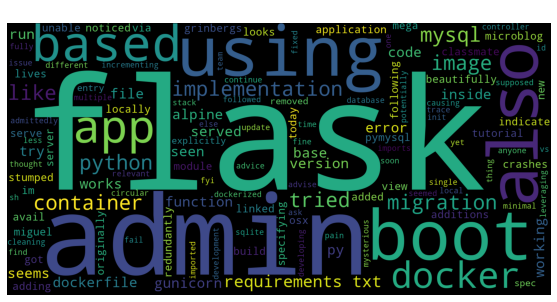

39151385


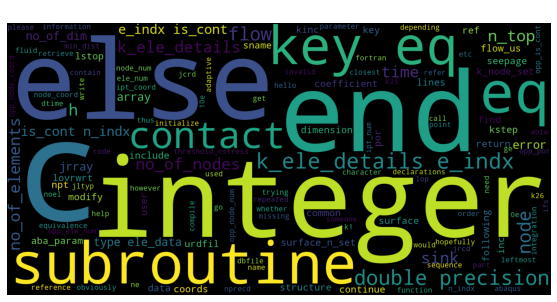

55774688


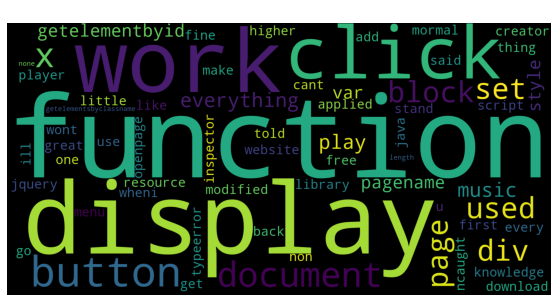

36525305


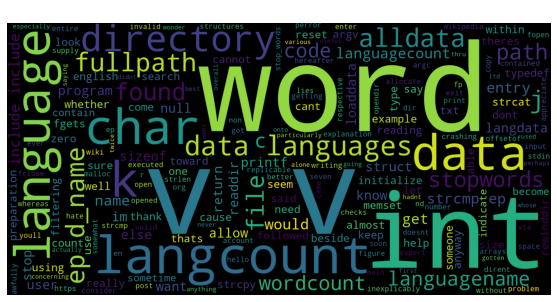

In [31]:
clean_datatext = pd.read_csv('data/clean_train_data.csv')
body_0 = clean_datatext['Body'][43375]
body_1 = clean_datatext['Body'][9653]
body_2 = clean_datatext['Body'][39901]
body_3 = clean_datatext['Body'][4645]

#nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

print(clean_datatext['Id'][43375])
corpus = body_0 #" ".join(body_0.values)
wc = wordcloud.WordCloud(width=1600, height=800, stopwords=stopwords).generate(corpus)
plt.figure(figsize=(10,5))
plt.title('Cluster 0')
plt.imshow(wc)
plt.axis("off")
plt.show()

print(clean_datatext['Id'][9653])
corpus = body_1 #" ".join(body_0.values)
wc = wordcloud.WordCloud(width=1600, height=800, stopwords=stopwords).generate(corpus)
plt.figure(figsize=(10,5))
plt.title('Cluster 1')
plt.imshow(wc)
plt.axis("off")
plt.show()

print(clean_datatext['Id'][39901])
corpus = body_2 #" ".join(body_0.values)
wc = wordcloud.WordCloud(width=1600, height=800, stopwords=stopwords).generate(corpus)
plt.figure(figsize=(10,5))
plt.title('Cluster 2')
plt.imshow(wc)
plt.axis("off")
plt.show()

print(clean_datatext['Id'][4645])
corpus = body_3 #" ".join(body_0.values)
wc = wordcloud.WordCloud(width=1600, height=800, stopwords=stopwords).generate(corpus)
plt.figure(figsize=(10,5))
plt.title('Cluster 3')
plt.imshow(wc)
plt.axis("off")
plt.show()

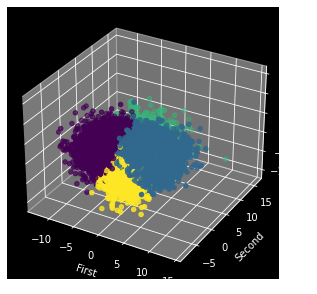

In [32]:
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(projection='3d')
ax.scatter(data_pca[:,0], data_pca[:,1], data_pca[:,2], c=clusters)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')

plt.show()

In [33]:
#data_frame['c'] = clusters
#sns.pairplot(data_frame, hue = 'c')

In [34]:
#Getting the text indices for each cluster:
k = 4 # Number clusters
indices = []*k
for i in range(k): indices.append([])
    
for j in range(len(clusters)):
    indices[clusters[j]].append(j)

In [35]:
np.save('data/indices0_english_100stopwords.npy', indices[0])
np.save('data/indices1_english_100stopwords.npy', indices[1])
np.save('data/indices2_english_100stopwords.npy', indices[2])
np.save('data/indices3_english_100stopwords.npy', indices[3])

### This is the end of this notebook! Please don't scroll more :) Nothing interesting :)

In [36]:
clean_datatext = pd.read_csv('data/clean_train_data.csv')
print(clean_datatext.shape)

(44996, 7)


In [37]:
body_0 = clean_datatext['Body'][indices[0]]
body_1 = clean_datatext['Body'][indices[1]]
body_2 = clean_datatext['Body'][indices[2]]
body_3 = clean_datatext['Body'][indices[3]]

#print(type(body_0))
#print(type(body_2))

In [38]:
# Run only one time per run
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jimenagonzalez/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


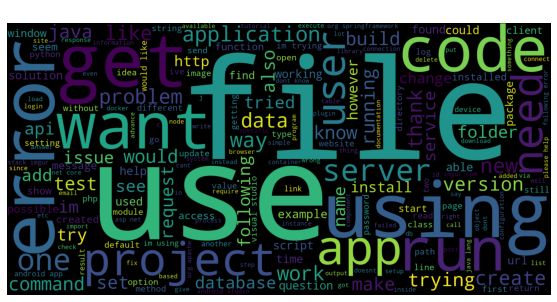

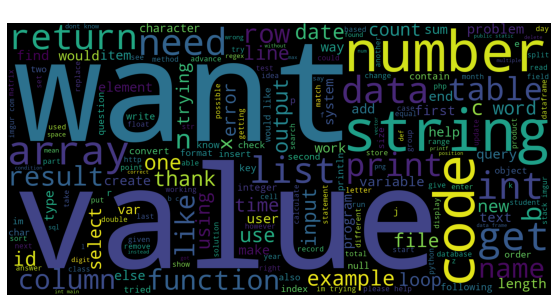

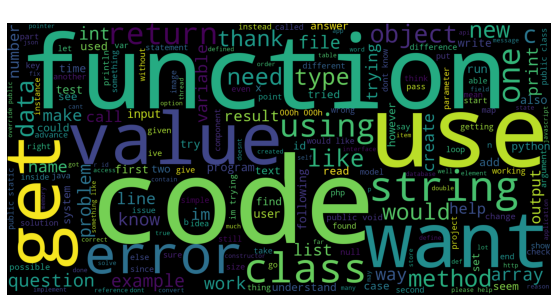

In [41]:
corpus = " ".join(body_0.values)
wc = wordcloud.WordCloud(width=1600, height=800, stopwords=stopwords).generate(corpus)

plt.figure(figsize=(10,5))
plt.title('Cluster 0')
plt.imshow(wc)
plt.axis("off")
plt.show()

corpus = " ".join(body_1.values)
wc = wordcloud.WordCloud(width=1600, height=800, stopwords=stopwords).generate(corpus)

plt.figure(figsize=(10,5))
plt.title('Cluster 1')
plt.imshow(wc)
plt.axis("off")
plt.show()

"""
corpus = " ".join(body_2.values)
wc = wordcloud.WordCloud(width=1600, height=800, stopwords=stopwords).generate(corpus)

plt.figure(figsize=(10,5))
plt.title('Cluster 2')
plt.imshow(wc)
plt.axis("off")
plt.show()
"""

corpus = " ".join(body_3.values)
wc = wordcloud.WordCloud(width=1600, height=800, stopwords=stopwords).generate(corpus)

plt.figure(figsize=(10,5))
plt.title('Cluster 3')
plt.imshow(wc)
plt.axis("off")
plt.show()
